!python -m pip install --upgrade pip

!pip install git+https://github.com/facebookresearch/segment-anything.git

## Model semantic segmentation
---

In [ ]:
#external
import random
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

#visualization
import cv2

#model
from src.segment_anything_model import SAMModel
from src.b3_seg_former_model import SegFormerModel
from segment_enhanced_model import SegmentEnhancedModel

#utils
from src.utils.dataset import load_foodseg103_splits

## Test image
---

In [2]:
image_dataset = load_foodseg103_splits()["test"]

In [3]:
test_image_idx = random.randint(0, len(image_dataset) - 1)
test_image_idx

199

In [4]:
test_image = np.array(image_dataset[test_image_idx]["image"])
image_rgb = cv2.resize(test_image, (512, 512), interpolation=cv2.INTER_LINEAR)
image_rgb.shape

(512, 512, 3)

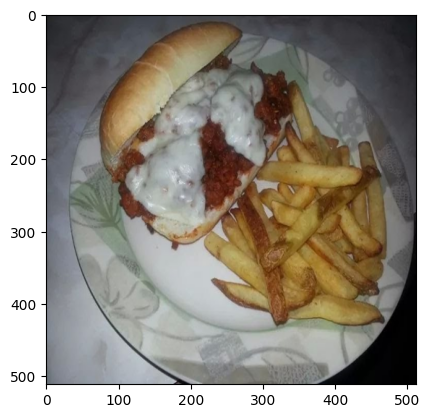

In [5]:
plt.imshow(image_rgb)
plt.show()

## Enhanced model class
---

In [ ]:
enhanced_model = SegmentEnhancedModel(sam_model_type="vit_b")

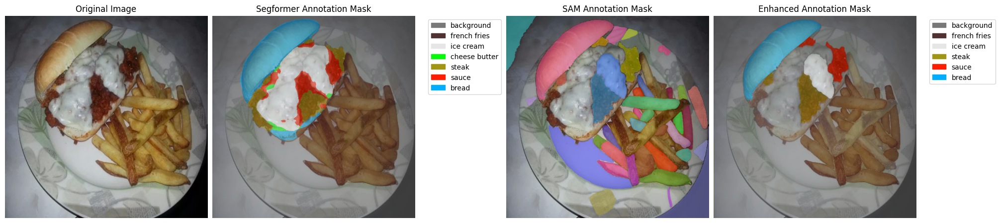

In [7]:
enhanced_model.preview_full_pipeline(image_rgb)

100%|██████████| 10/10 [00:48<00:00,  4.86s/it]


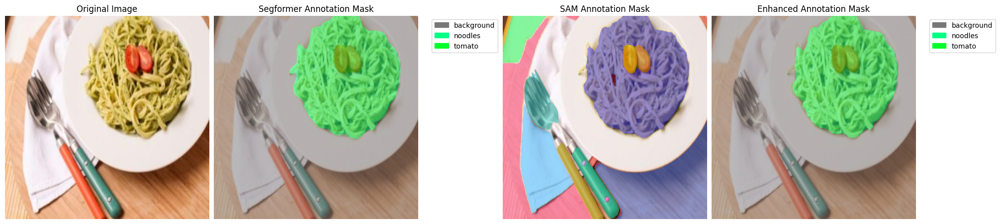

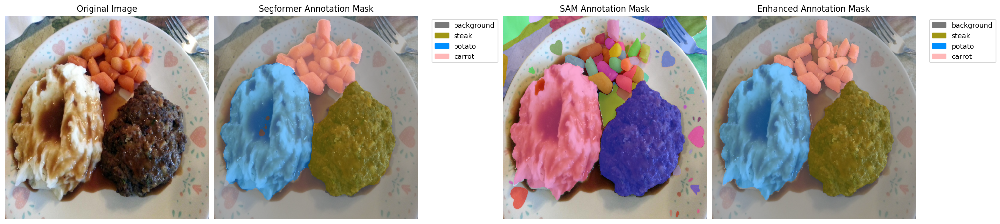

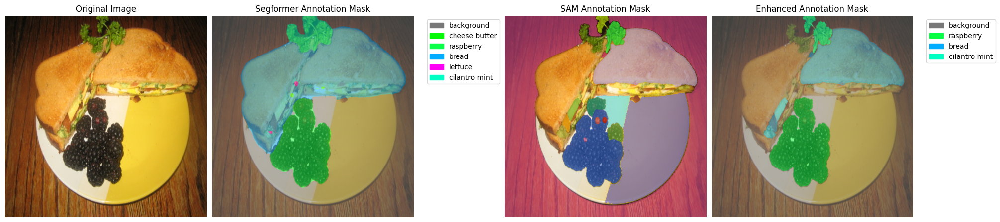

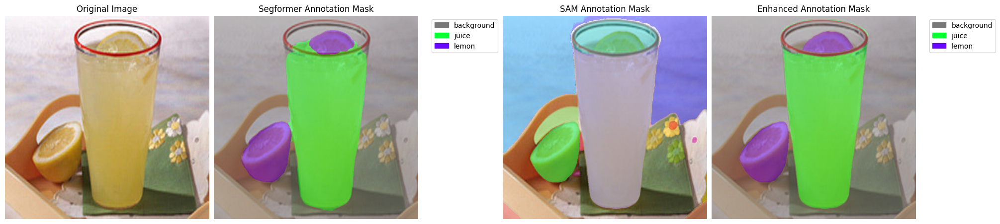

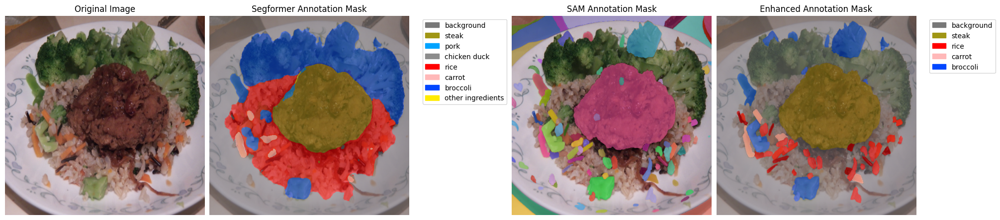

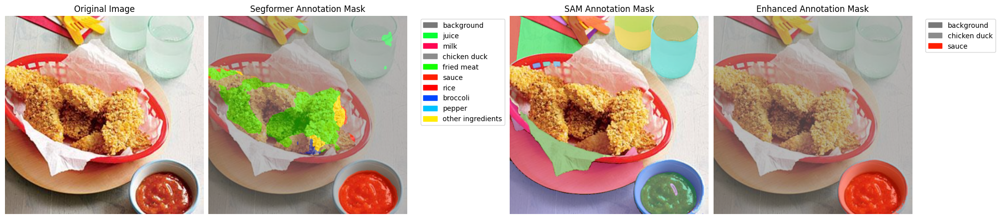

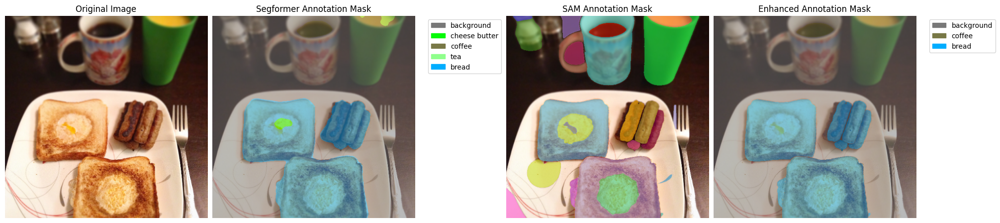

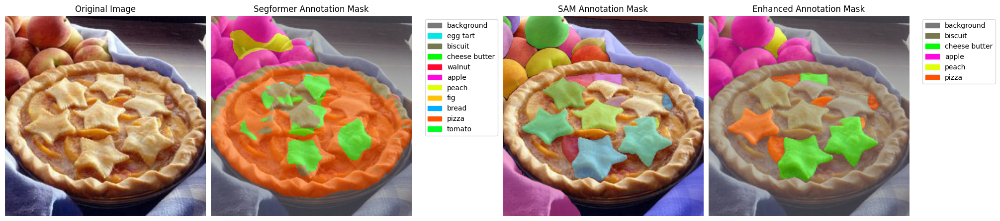

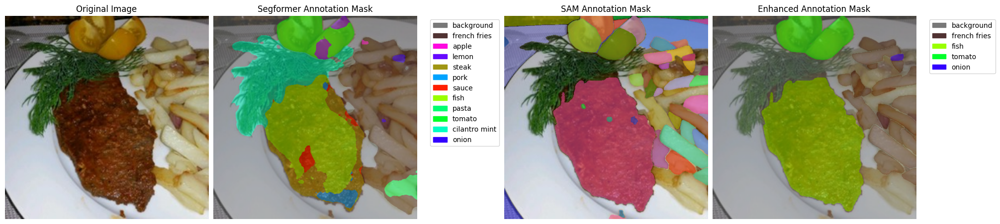

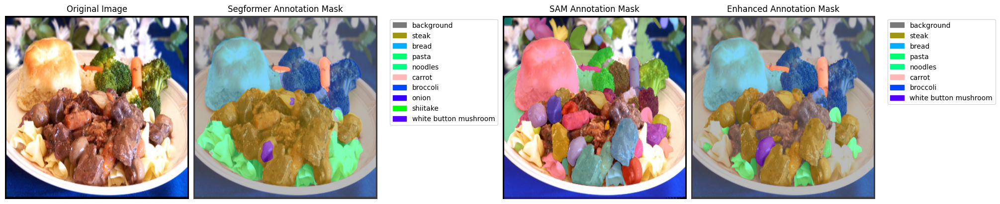

In [ ]:
for id in tqdm(range(10)):
    test_image_idx = random.randint(0, len(image_dataset) - 1)
    test_image = np.array(image_dataset[test_image_idx]["image"])
    image_rgb = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
    image_rgb = cv2.resize(test_image, (512, 512), interpolation=cv2.INTER_LINEAR)
    enhanced_model.preview_full_pipeline(image_rgb.copy())

## SAM segmentation
---

In [ ]:
sam_model = SAMModel(model_type="vit_h", process_mask_size=(256, 256))

In [ ]:
sam_segmentation_masks = sam_model.predict_segmentation_mask(image_rgb.copy(), merge_similar=True)

In [ ]:
sam_model.preview_image_segmentation(image_rgb.copy(), sam_segmentation_masks, legend=False)

In [ ]:
sam_model.preview_image_segmentation(image_rgb.copy(), sam_segmentation_masks, legend=False)

## B3 SegFormer
---

In [ ]:
segformer_model = SegFormerModel()

In [ ]:
segformer_mask = segformer_model.predict_segmentation_mask(image_rgb)

In [ ]:
segformer_model.preview_image_segmentation(image_rgb, segformer_mask)

## References

[1] https://blog.roboflow.com/how-to-use-segment-anything-model-sam/